<a href="https://colab.research.google.com/github/EstebanBotero03/Senalesysistemas/blob/main/PARTE_2_LAPLACE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## PUNTO 1

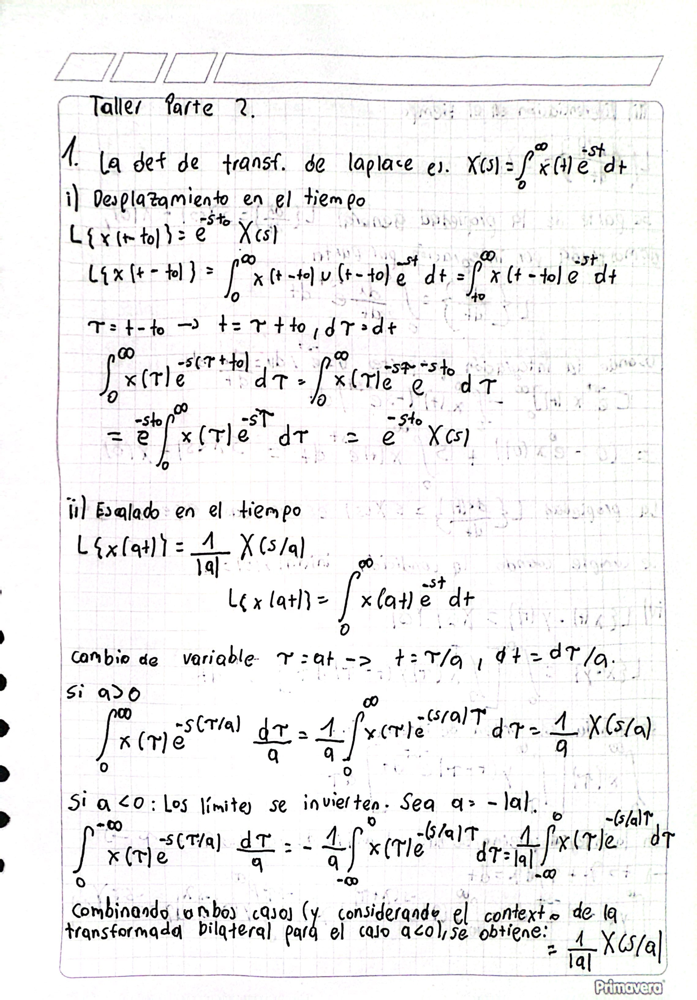

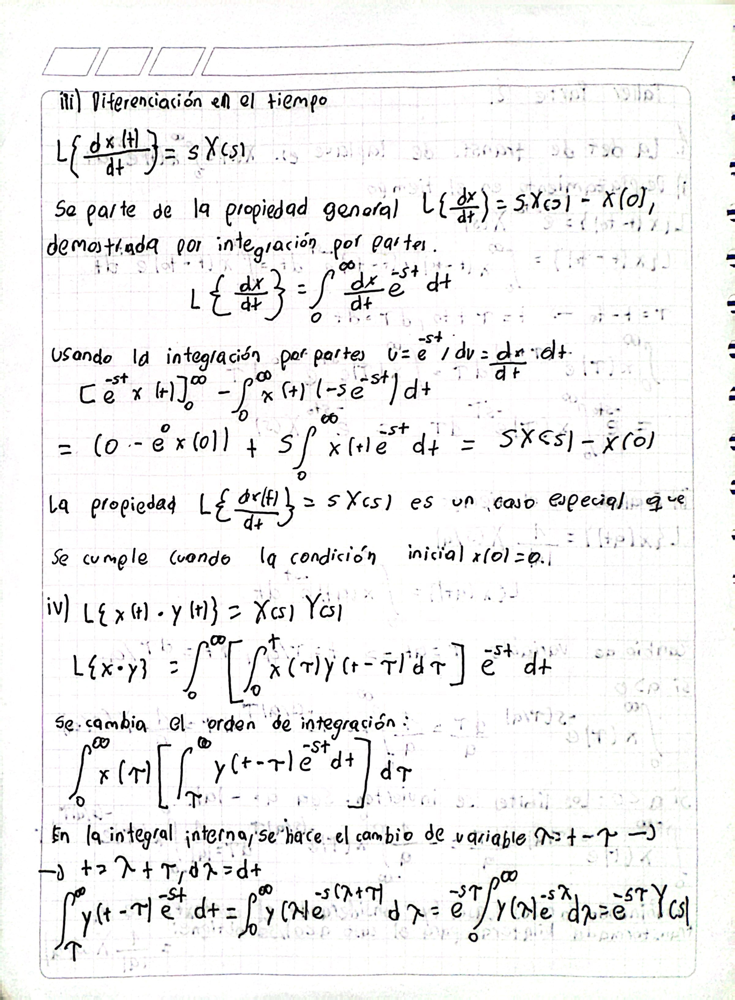



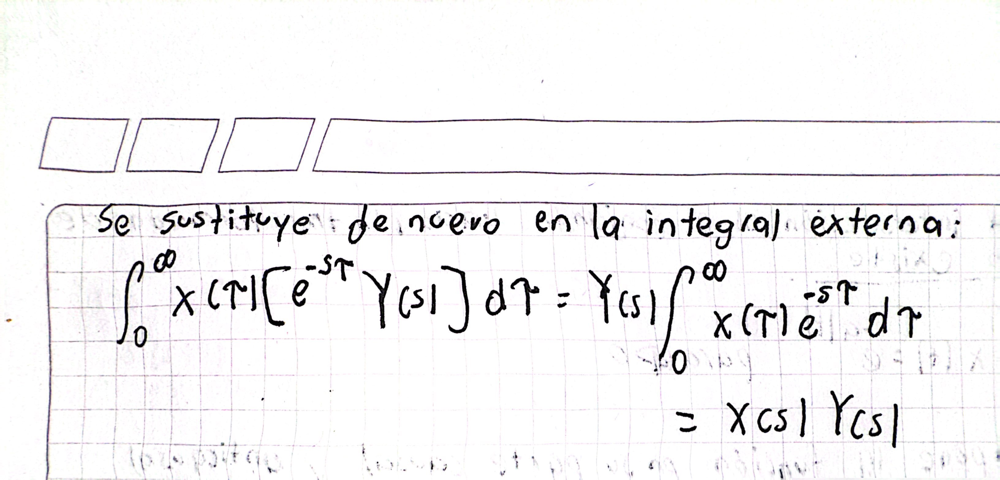

## PUNTO 2

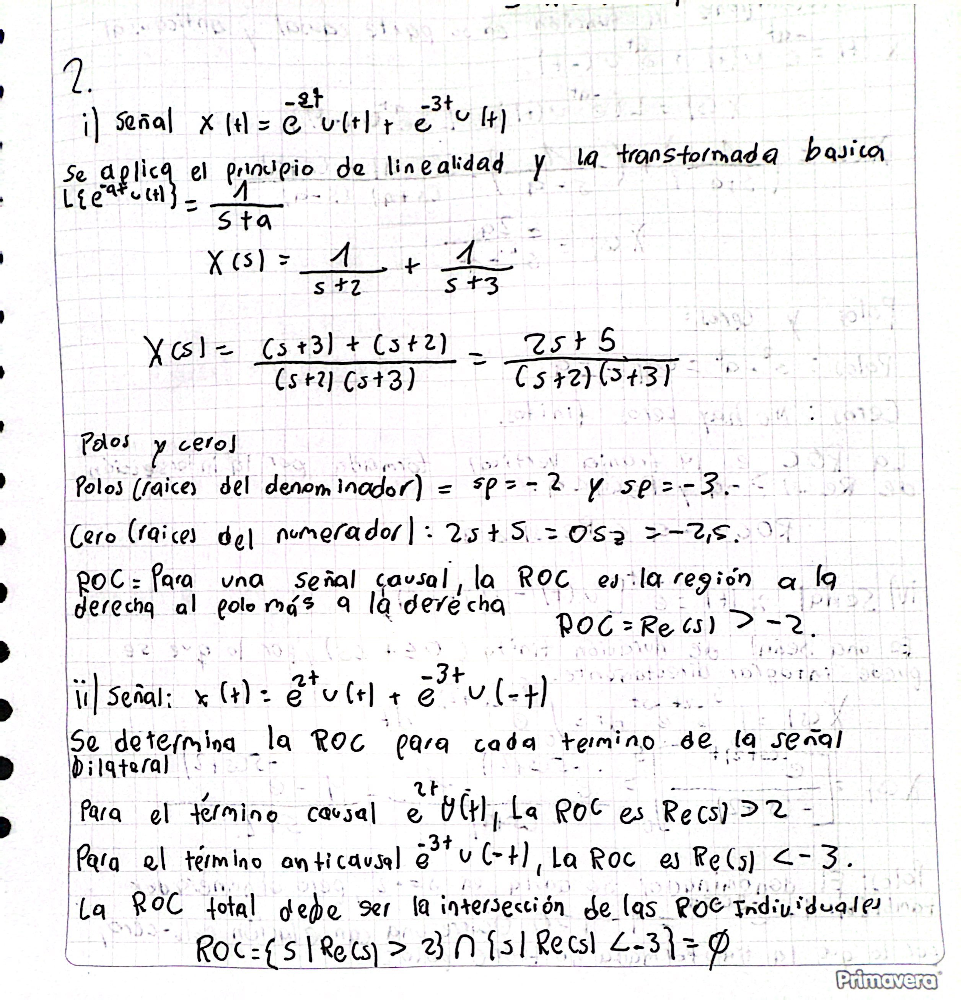

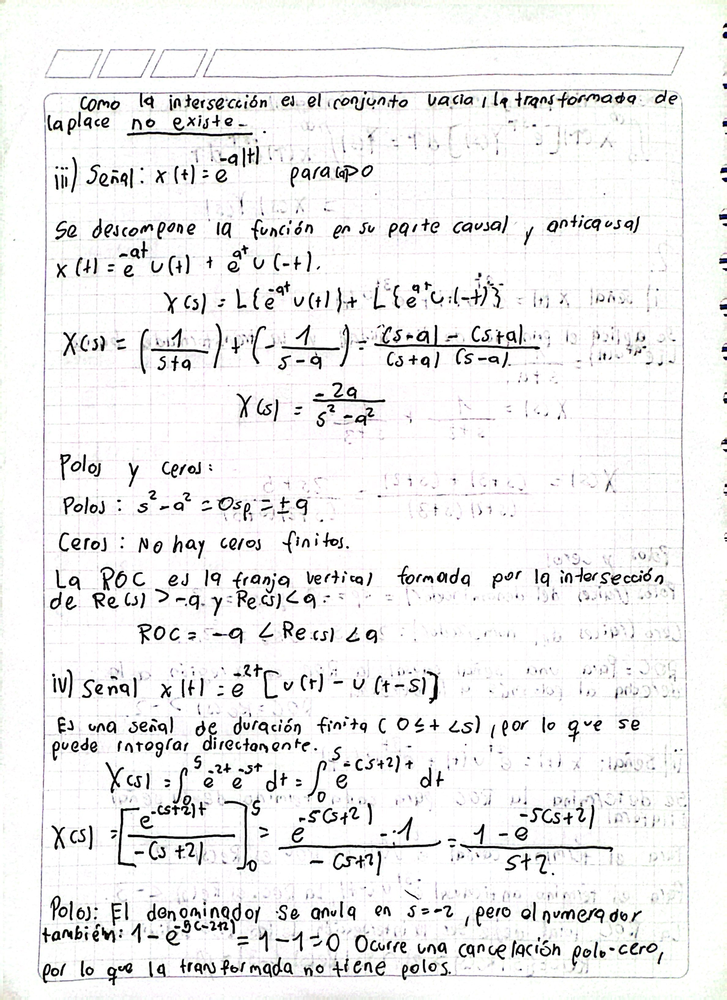

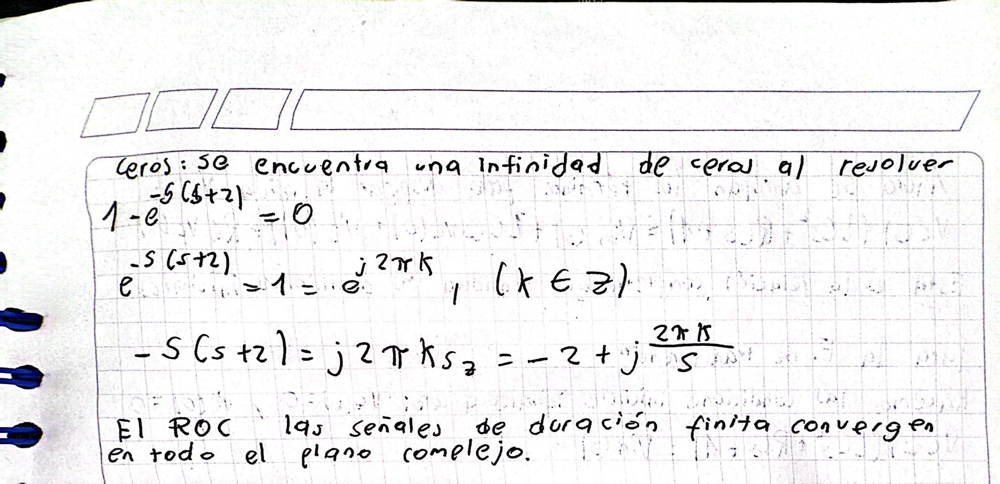

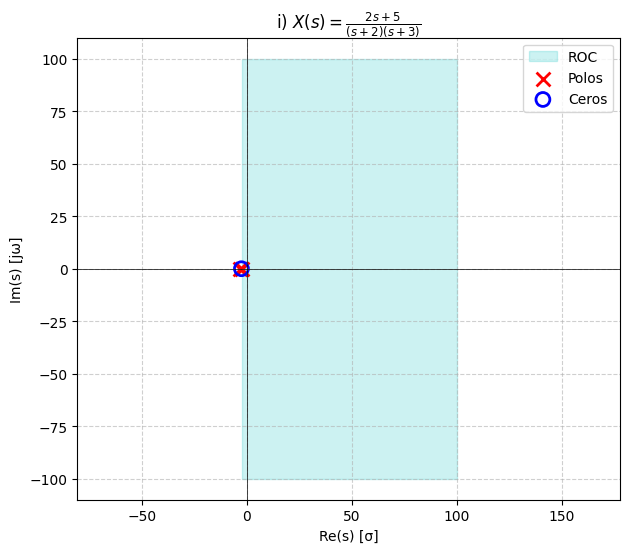

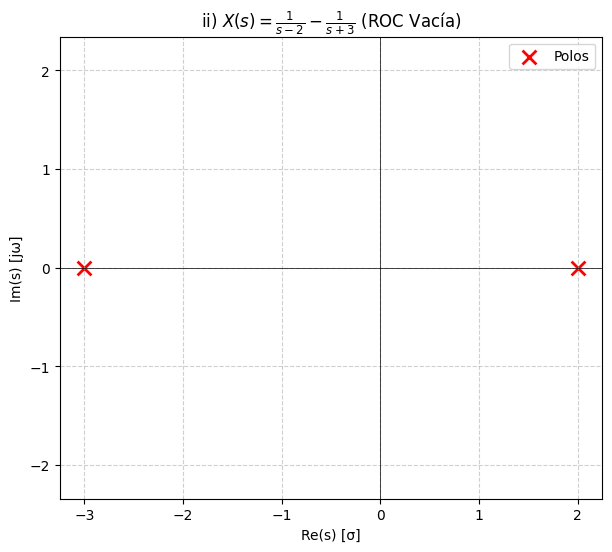

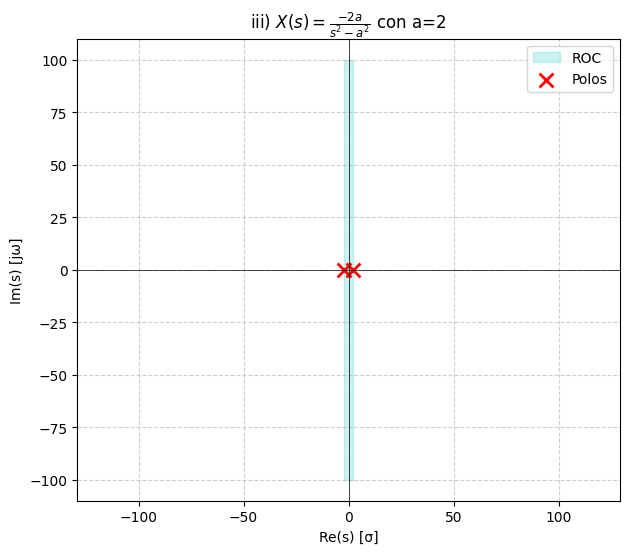

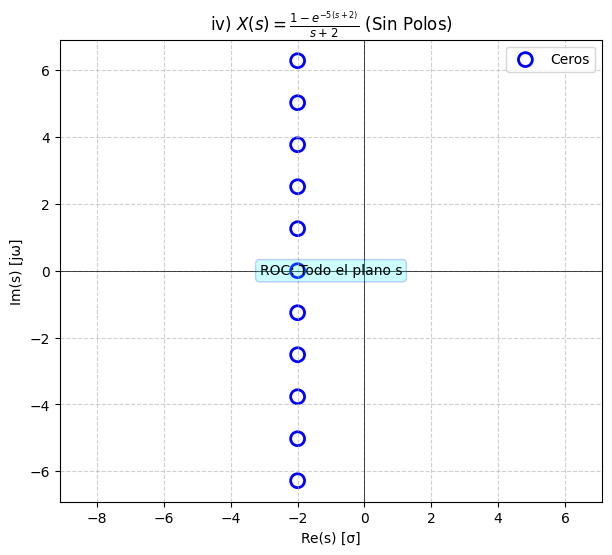

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def plot_pz_plane(poles, zeros, roc_type='none', roc_val=None, title='Esquema de Polos y Ceros', x_lim=None, y_lim=None):
    """
    Función para graficar el esquema de polos, ceros y la ROC en el plano s.
    """
    fig, ax = plt.subplots(figsize=(7, 6))

    # Dibuja los ejes Re(s) e Im(s)
    ax.axhline(0, color='k', lw=0.5)
    ax.axvline(0, color='k', lw=0.5)
    ax.set_xlabel('Re(s) [σ]')
    ax.set_ylabel('Im(s) [jω]')
    ax.set_title(title)
    ax.grid(True, linestyle='--', alpha=0.6)

    # Dibuja la Región de Convergencia (ROC)
    if roc_type != 'none' and roc_type != 'all':
        y = np.linspace(-100, 100, 100) # Un valor grande para y
        if roc_type == 'right':
            ax.fill_betweenx(y, roc_val, 100, alpha=0.2, color='c', label='ROC')
        elif roc_type == 'left':
            ax.fill_betweenx(y, -100, roc_val, alpha=0.2, color='c', label='ROC')
        elif roc_type == 'strip' and roc_val is not None:
            ax.fill_betweenx(y, roc_val[0], roc_val[1], alpha=0.2, color='c', label='ROC')
    elif roc_type == 'all':
        ax.text(0.5, 0.5, 'ROC: Todo el plano s', horizontalalignment='center',
                verticalalignment='center', transform=ax.transAxes,
                bbox=dict(boxstyle="round,pad=0.3", fc="cyan", ec="b", lw=1, alpha=0.2))


    # Dibuja los polos y ceros
    # ---- LÍNEAS CORREGIDAS ----
    if np.size(poles) > 0:
      ax.scatter(np.real(poles), np.imag(poles), marker='x', s=100, lw=2, color='r', label='Polos')
    if np.size(zeros) > 0:
      ax.scatter(np.real(zeros), np.imag(zeros), marker='o', s=100, lw=2, facecolors='none', edgecolors='b', label='Ceros')

    # Ajusta los límites y la leyenda
    if x_lim: ax.set_xlim(x_lim)
    if y_lim: ax.set_ylim(y_lim)
    ax.legend()
    ax.axis('equal') # Asegura que la escala de los ejes sea la misma
    plt.show()

# --- 1. Señal i) ---
poles_i = [-2, -3]
zeros_i = [-2.5]
plot_pz_plane(poles_i, zeros_i, roc_type='right', roc_val=-2,
              title='i) $X(s) = \\frac{2s+5}{(s+2)(s+3)}$',
              x_lim=[-4, 1])

# --- 2. Señal ii) ---
poles_ii = [2, -3]
zeros_ii = []
plot_pz_plane(poles_ii, zeros_ii, roc_type='none',
              title='ii) $X(s) = \\frac{1}{s-2} - \\frac{1}{s+3}$ (ROC Vacía)',
              x_lim=[-4, 3])


# --- 3. Señal iii) ---
a = 2
poles_iii = [a, -a]
zeros_iii = []
plot_pz_plane(poles_iii, zeros_iii, roc_type='strip', roc_val=[-a, a],
              title=f'iii) $X(s) = \\frac{{-2a}}{{s^2-a^2}}$ con a={a}',
              x_lim=[-3, 3])


# --- 4. Señal iv) ---
poles_iv = []
k = np.arange(-5, 6)
zeros_iv = -2 + 1j * (2 * np.pi * k) / 5
plot_pz_plane(poles_iv, zeros_iv, roc_type='all',
              title='iv) $X(s) = \\frac{1 - e^{-5(s+2)}}{s+2}$ (Sin Polos)',
              x_lim=[-4, 0], y_lim=[-8, 8])

## PUNTO 3

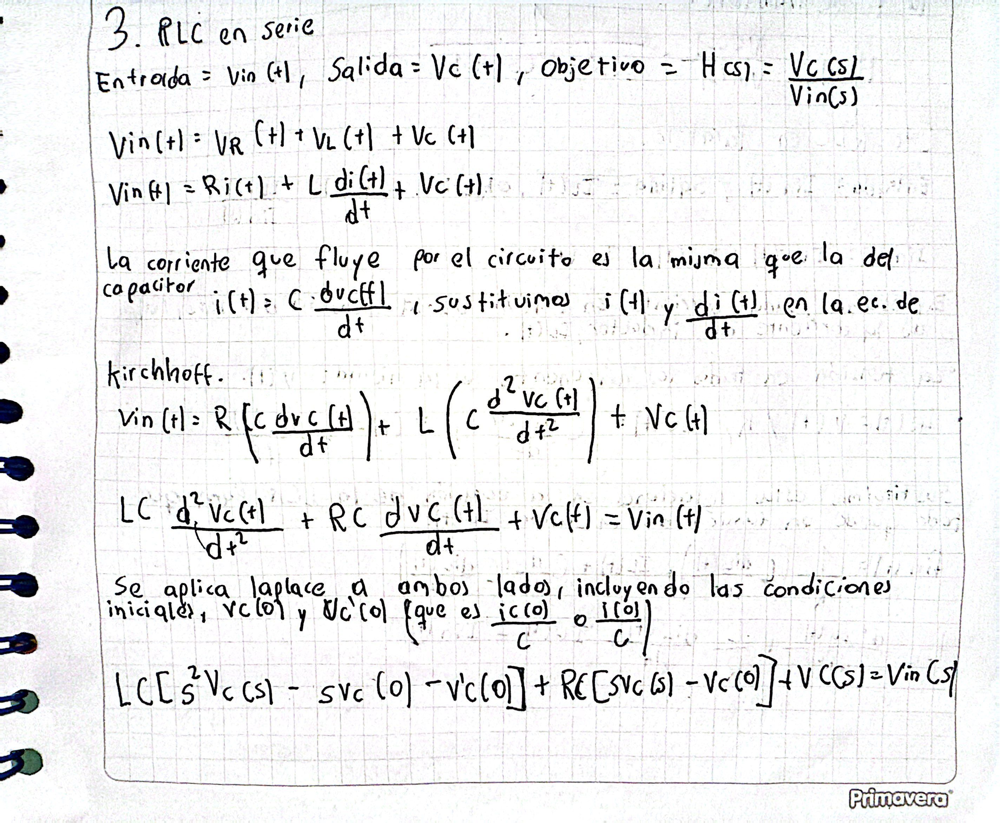

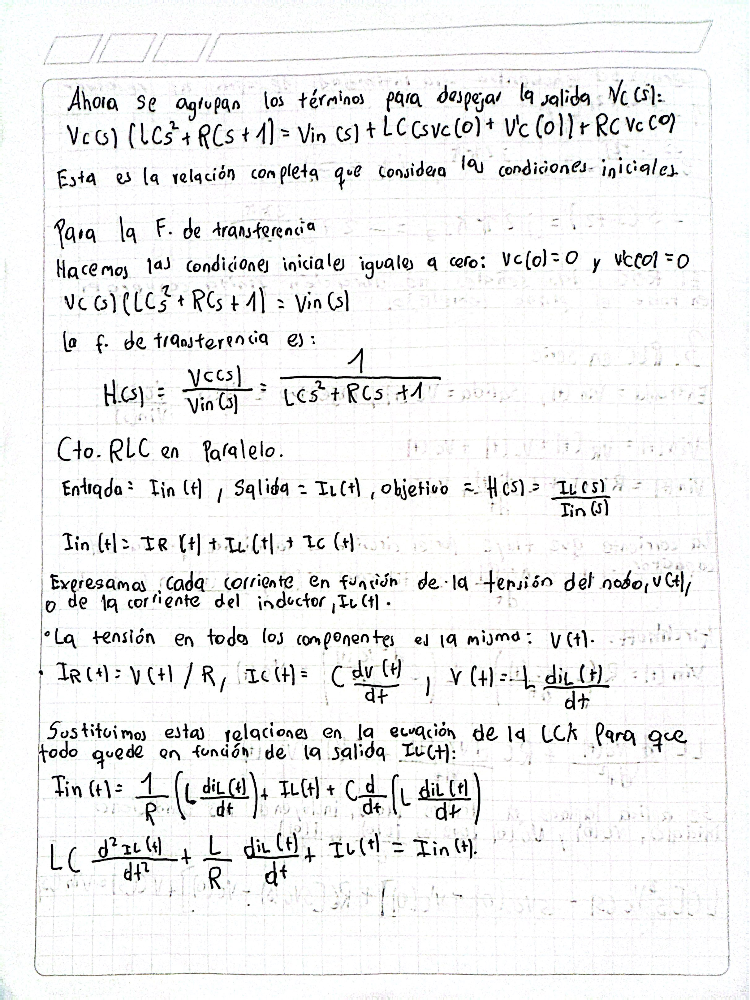

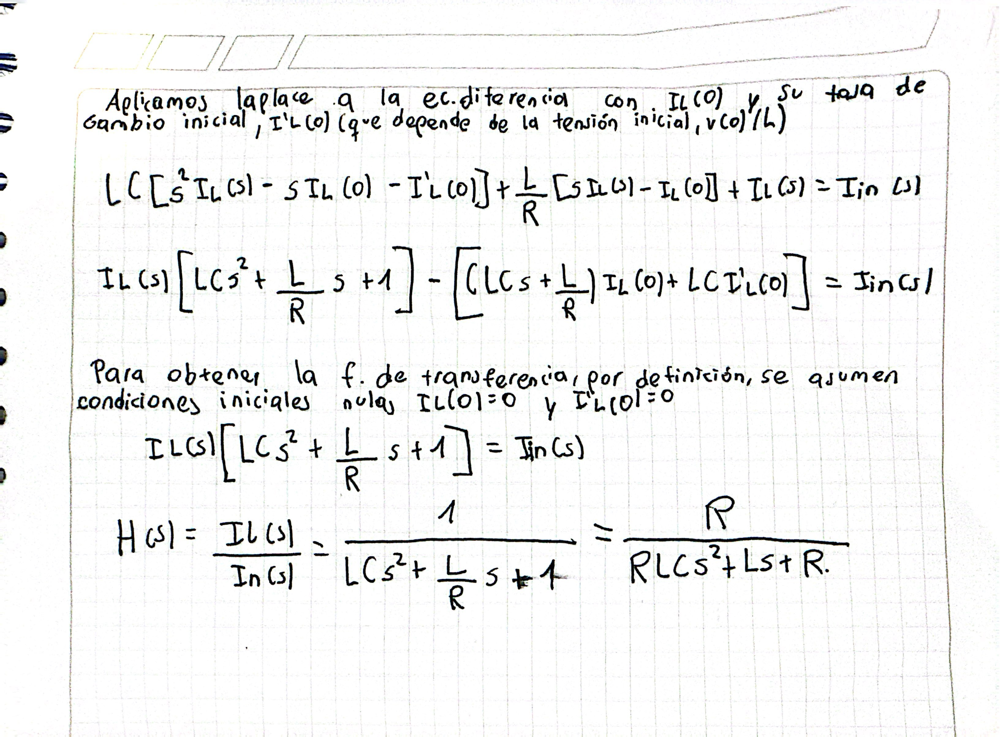

## PUNTO 4

✅ Todos los cálculos simbólicos se han completado y guardado.

📈 Generando Gráficas Numéricas...


<lambdifygenerated-2>:2: RuntimeWarning: invalid value encountered in divide
  return 2*exp(-1/2*R*t/L)*sin((1/2)*t*sqrt(-C*R**2 + 8*L)/(sqrt(C)*L))/(sqrt(C)*sqrt(-C*R**2 + 8*L))


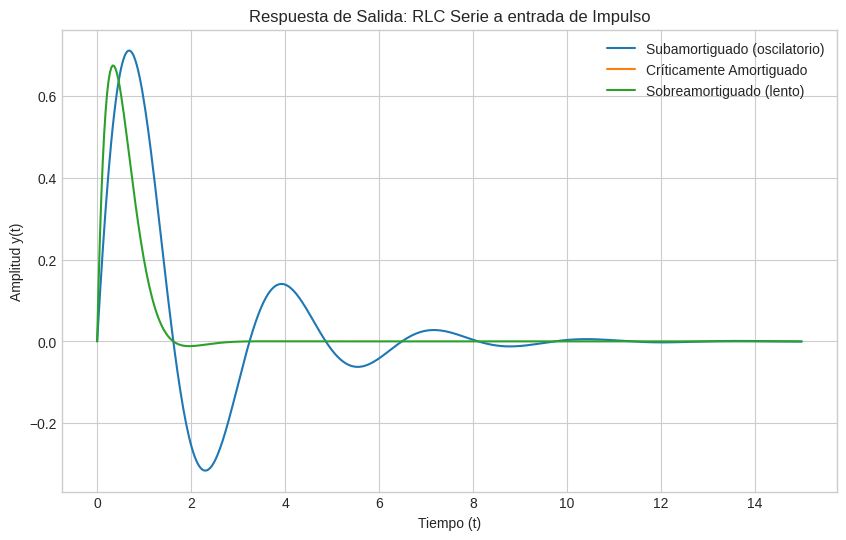

<lambdifygenerated-5>:2: RuntimeWarning: invalid value encountered in divide
  return -1/2*sqrt(C)*R*exp(-1/2*R*t/L)*sin((1/2)*t*sqrt(-C*R**2 + 8*L)/(sqrt(C)*L))/sqrt(-C*R**2 + 8*L) + 1/2 - 1/2*exp(-1/2*R*t/L)*cos((1/2)*t*sqrt(-C*R**2 + 8*L)/(sqrt(C)*L))


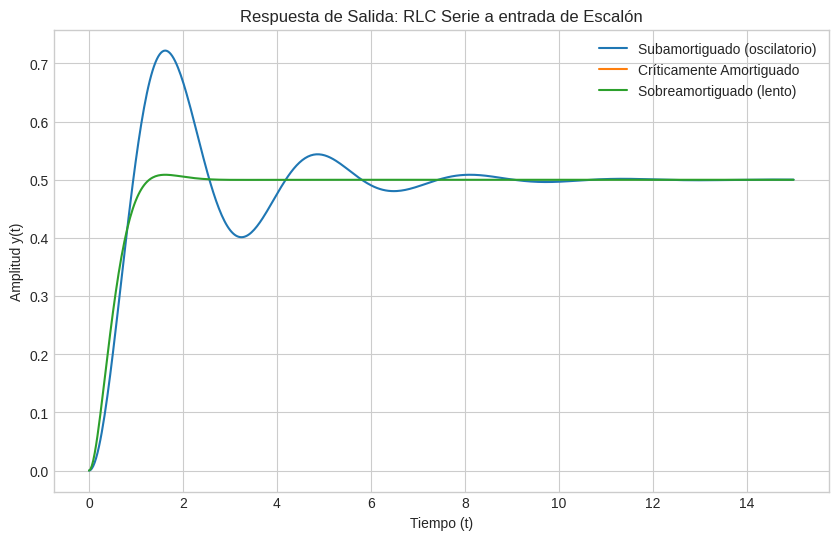

<lambdifygenerated-8>:2: RuntimeWarning: invalid value encountered in divide
  return (1/4)*(C**(3/2)*R*sqrt(-C*R**2 + 8*L)*exp((1/2)*R*t/L)*cos((1/2)*t*sqrt(-C*R**2 + 8*L)/(sqrt(C)*L)) + sqrt(C)*(-C*R + 2*t)*sqrt(-C*R**2 + 8*L)*exp(R*t/L) - C*(-C*R**2 + 4*L)*exp((1/2)*R*t/L)*sin((1/2)*t*sqrt(-C*R**2 + 8*L)/(sqrt(C)*L)))*exp(-R*t/L)/(sqrt(C)*sqrt(-C*R**2 + 8*L))


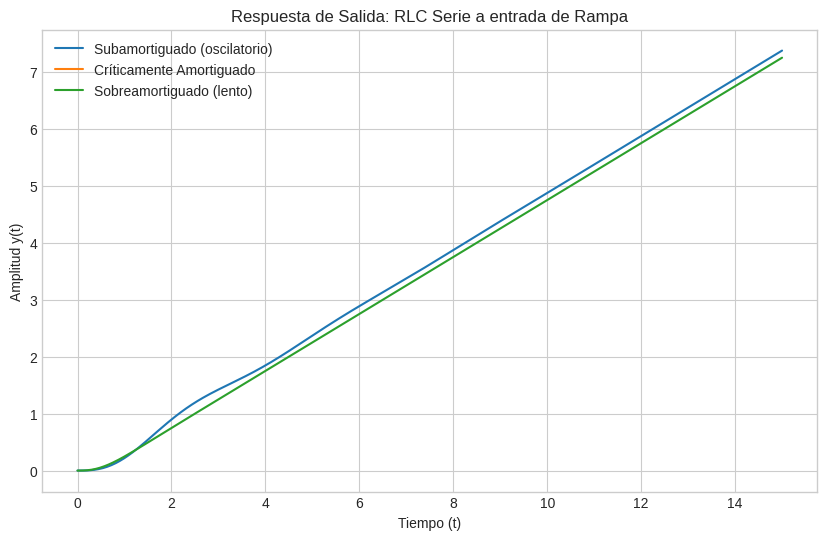

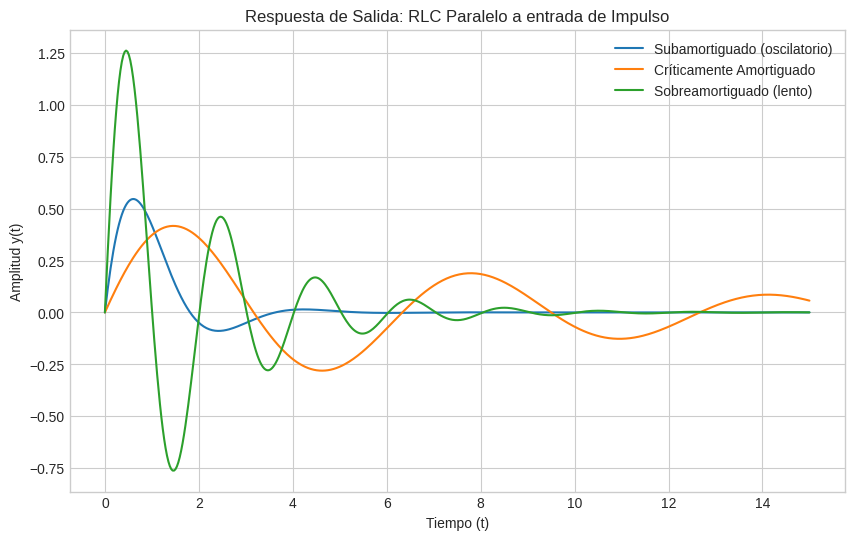

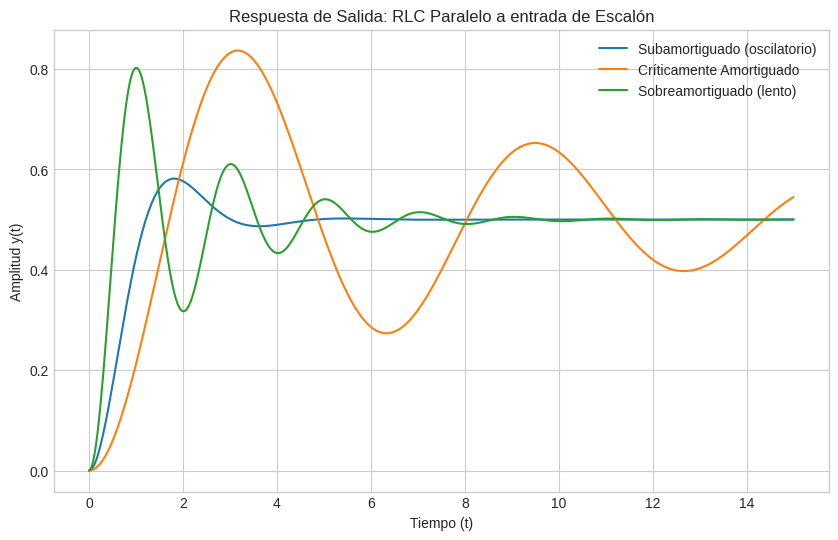

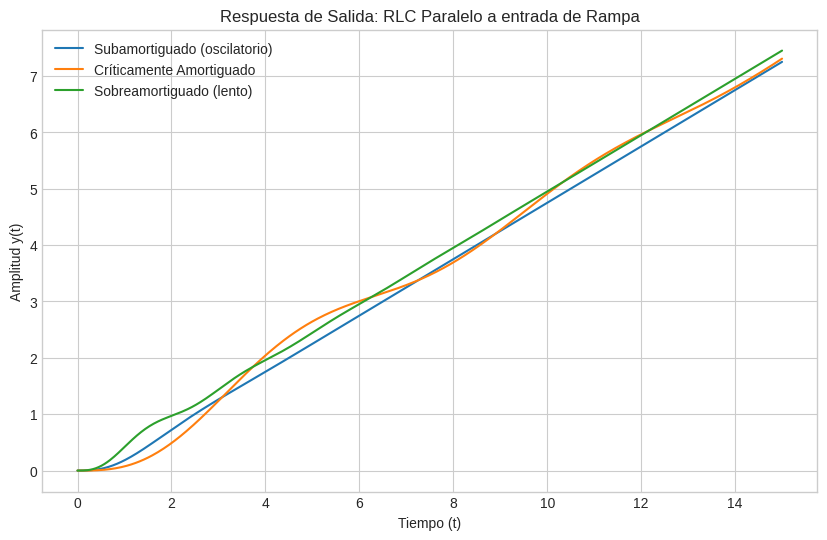

In [2]:
# ==============================================================================
# PASO 1: Importación de bibliotecas y configuración de SymPy
# ==============================================================================
import sympy as sp
import numpy as np
import matplotlib.pyplot as plt

# Esta línea es CLAVE: activa la renderización de ecuaciones con LaTeX en Colab
# para una visualización clara.
sp.init_printing()

# ==============================================================================
# PASO 2: Definición y cálculo simbólico
# ==============================================================================

# Define todas las variables simbólicas necesarias
s, t, R, L, C = sp.symbols('s t R L C', positive=True, real=True)

# Define las funciones de transferencia en LAZO ABIERTO G(s)
G_serie = 1 / (L*C*s**2 + R*C*s + 1)
G_paralelo = R / (R*L*C*s**2 + L*s + R)

# Calcula las funciones de transferencia en LAZO CERRADO T(s) con realimentación unitaria
T_serie = sp.simplify(G_serie / (1 + G_serie))
T_paralelo = sp.simplify(G_paralelo / (1 + G_paralelo))

# Define las entradas en el dominio de Laplace X(s)
X_impulso = 1
X_escalon = 1/s
X_rampa = 1/s**2

# Diccionarios para organizar y almacenar los resultados
transfer_functions = {'RLC Serie': T_serie, 'RLC Paralelo': T_paralelo}
inputs = {'Impulso': X_impulso, 'Escalón': X_escalon, 'Rampa': X_rampa}
symbolic_responses = {}

# Este bucle calcula todas las respuestas en el tiempo y las guarda
# en el diccionario 'symbolic_responses' sin imprimirlas en la consola.
for tf_name, T in transfer_functions.items():
    symbolic_responses[tf_name] = {}
    for input_name, X in inputs.items():
        Y = T * X
        y_t = sp.inverse_laplace_transform(Y, s, t)
        y_t_simplified = sp.simplify(y_t)
        symbolic_responses[tf_name][input_name] = y_t_simplified

print("✅ Todos los cálculos simbólicos se han completado y guardado.")

# ==============================================================================
# PASO 3: Definición de la función para graficar
# ==============================================================================
plt.style.use('seaborn-v0_8-whitegrid')

def plot_numerical_responses():
    """
    Esta función genera todas las gráficas con valores numéricos para R, L y C.
    """
    # Valores de componentes para distintos casos de amortiguamiento
    cases = {
        'Subamortiguado (oscilatorio)': {'R': 1.0, 'L': 1.0, 'C': 0.5},
        'Críticamente Amortiguado': {'R': 4.0, 'L': 2.0, 'C': 1.0},
        'Sobreamortiguado (lento)': {'R': 5.0, 'L': 1.0, 'C': 0.2}
    }

    t_vals = np.linspace(0, 15, 500) # Vector de tiempo para graficar

    print("\n📈 Generando Gráficas Numéricas...")

    for tf_name, responses in symbolic_responses.items():
        for input_name, y_t_sym in responses.items():
            fig, ax = plt.subplots(figsize=(10, 6))

            for case_name, values in cases.items():
                # Convierte la expresión simbólica de SymPy a una función numérica rápida
                y_func = sp.lambdify((t, R, L, C), y_t_sym, 'numpy')

                # Calcula la respuesta numérica para los valores del caso actual
                y_vals = y_func(t_vals, values['R'], values['L'], values['C'])

                # Grafica la respuesta
                ax.plot(t_vals, y_vals, label=f'{case_name}')

            ax.set_title(f'Respuesta de Salida: {tf_name} a entrada de {input_name}')
            ax.set_xlabel('Tiempo (t)')
            ax.set_ylabel('Amplitud y(t)')
            ax.legend()
            ax.grid(True)
            plt.show()

# Se llama a la función para que genere las gráficas al final.
plot_numerical_responses()

In [3]:
symbolic_responses['RLC Serie']['Escalón']

        -R⋅t     ⎛     ______________⎞        -R⋅t     ⎛     ______________⎞
        ─────    ⎜    ╱      2       ⎟        ─────    ⎜    ╱      2       ⎟
         2⋅L     ⎜t⋅╲╱  - C⋅R  + 8⋅L ⎟         2⋅L     ⎜t⋅╲╱  - C⋅R  + 8⋅L ⎟
  √C⋅R⋅ℯ     ⋅sin⎜───────────────────⎟       ℯ     ⋅cos⎜───────────────────⎟
                 ⎝      2⋅√C⋅L       ⎠   1             ⎝      2⋅√C⋅L       ⎠
- ──────────────────────────────────── + ─ - ───────────────────────────────
               ______________            2                  2               
              ╱      2                                                      
          2⋅╲╱  - C⋅R  + 8⋅L                                                

In [4]:
symbolic_responses['RLC Paralelo']['Impulso']

      -t      ⎛     ____________⎞
     ─────    ⎜    ╱      2     ⎟
     2⋅C⋅R    ⎜t⋅╲╱  8⋅C⋅R  - L ⎟
2⋅R⋅ℯ     ⋅sin⎜─────────────────⎟
              ⎝    2⋅C⋅√L⋅R     ⎠
─────────────────────────────────
             ____________        
            ╱      2             
       √L⋅╲╱  8⋅C⋅R  - L         

In [5]:
symbolic_responses['RLC Serie']['Rampa']

⎛                          R⋅t    ⎛     ______________⎞                        ↪
⎜          ______________  ───    ⎜    ╱      2       ⎟                      _ ↪
⎜ 3/2     ╱      2         2⋅L    ⎜t⋅╲╱  - C⋅R  + 8⋅L ⎟                     ╱  ↪
⎜C   ⋅R⋅╲╱  - C⋅R  + 8⋅L ⋅ℯ   ⋅cos⎜───────────────────⎟ + √C⋅(-C⋅R + 2⋅t)⋅╲╱   ↪
⎝                                 ⎝      2⋅√C⋅L       ⎠                        ↪
────────────────────────────────────────────────────────────────────────────── ↪
                                                                         _____ ↪
                                                                        ╱      ↪
                                                                 4⋅√C⋅╲╱  - C⋅ ↪

↪                R⋅t                     R⋅t    ⎛     ______________⎞⎞  -R⋅t 
↪ _____________  ───                     ───    ⎜    ╱      2       ⎟⎟  ─────
↪      2          L      ⎛     2      ⎞  2⋅L    ⎜t⋅╲╱  - C⋅R  + 8⋅L ⎟⎟    L  
↪ - C⋅R  + 8⋅L ⋅ℯ    - C⋅⎝- C⋅R  + 4

##PUNTO 5

In [8]:
!pip install -q streamlit pyngrok control

In [9]:
%%writefile app.py
import streamlit as st
import numpy as np
import matplotlib.pyplot as plt
import control as ct

# --- Configuración de la Página y Título ---
st.set_page_config(layout="wide", page_title="Dashboard de Sistemas RLC")
st.title("Análisis Interactivo de Sistemas RLC de Segundo Orden")
st.markdown("Esta herramienta permite simular y analizar la respuesta de circuitos RLC en lazo abierto.")

# --- Barra Lateral de Controles (Inputs del Usuario) ---
st.sidebar.header("⚙️ Controles de Simulación")

# 1. Selección de tipo de circuito
circuit_type = st.sidebar.selectbox(
    "Seleccione el Tipo de Circuito",
    ("RLC Serie", "RLC Paralelo")
)

# 2. Selección del tipo de respuesta deseada
response_type = st.sidebar.selectbox(
    "Seleccione el Tipo de Respuesta",
    ("Subamortiguado", "Críticamente Amortiguado", "Sobreamortiguado", "Inestable")
)

# 3. Sliders para Zeta y Omega_n basados en la respuesta
if response_type == "Subamortiguado":
    zeta = st.sidebar.slider("Factor de Amortiguamiento (ζ)", 0.01, 0.99, 0.3, 0.01)
elif response_type == "Críticamente Amortiguado":
    zeta = 1.0
    st.sidebar.info("ζ = 1 para amortiguamiento crítico.")
elif response_type == "Sobreamortiguado":
    zeta = st.sidebar.slider("Factor de Amortiguamiento (ζ)", 1.01, 5.0, 1.5, 0.01)
else: # Inestable
    zeta = st.sidebar.slider("Factor de Amortiguamiento (ζ)", -1.0, -0.01, -0.2, 0.01)

omega_n = st.sidebar.slider("Frecuencia Natural (ωn) [rad/s]", 1.0, 20.0, 5.0, 0.1)

# --- Cálculo Inverso de Componentes R, L, C ---
L = 1.0
C = 1 / (omega_n**2)

if circuit_type == "RLC Serie":
    R = 2 * zeta * np.sqrt(L / C)
else: # RLC Paralelo
    R = (1 / (2 * zeta)) * np.sqrt(L / C)

st.sidebar.subheader("Valores Estimados de Componentes")
st.sidebar.info(f"**Resistencia (R):** {R:.3f} Ω\n\n**Inductancia (L):** {L:.3f} H\n\n**Capacitancia (C):** {C:.3f} F")

# --- Creación de la Función de Transferencia ---
if circuit_type == "RLC Serie":
    num = [1]
    den = [L*C, R*C, 1]
else: # RLC Paralelo
    num = [R]
    den = [R*L*C, L, R]

system = ct.TransferFunction(num, den)

# --- Visualización en el Dashboard Principal ---
st.header(f"Análisis para el Circuito {circuit_type}")
col1, col2 = st.columns(2)

with col1:
    st.subheader("Diagrama de Bode")
    fig1, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6))
    mag, phase, omega = ct.bode_plot(system, plot=False)
    ax1.semilogx(omega, 20 * np.log10(mag))
    ax1.set_ylabel("Magnitud (dB)")
    ax1.grid(True, which='both')
    ax2.semilogx(omega, np.rad2deg(phase))
    ax2.set_ylabel("Fase (grados)")
    ax2.set_xlabel("Frecuencia (rad/s)")
    ax2.grid(True, which='both')
    st.pyplot(fig1)

    st.subheader("Diagrama de Polos y Ceros")
    fig2, ax = plt.subplots(figsize=(8, 6))
    ct.pole_zero_plot(system, ax=ax)
    ax.grid(True)
    st.pyplot(fig2)

with col2:
    st.subheader("Métricas de Rendimiento (Respuesta al Escalón)")
    try:
        info = ct.step_info(system)
        st.metric("Tiempo de Levantamiento (Tr)", f"{info.get('RiseTime', 0):.3f} s")
        st.metric("Máximo Sobreimpulso (%)", f"{info.get('Overshoot', 0):.2f}")
        st.metric("Tiempo del Sobreimpulso (Tp)", f"{info.get('PeakTime', 0):.3f} s")
        st.metric("Tiempo de Establecimiento (Ts)", f"{info.get('SettlingTime', 0):.3f} s")
    except (ValueError, IndexError):
        st.warning("No se pueden calcular las métricas para un sistema inestable.")

    st.subheader("Respuestas en el Tiempo")
    t = np.linspace(0, 15, 800)

    fig3, ax = plt.subplots(3, 1, figsize=(8, 9), sharex=True)
    t_imp, y_imp = ct.impulse_response(system, T=t)
    ax[0].plot(t_imp, y_imp)
    ax[0].set_title("Respuesta al Impulso")
    ax[0].set_ylabel("Amplitud")
    ax[0].grid(True)

    t_step, y_step = ct.step_response(system, T=t)
    ax[1].plot(t_step, y_step)
    ax[1].set_title("Respuesta al Escalón")
    ax[1].set_ylabel("Amplitud")
    ax[1].grid(True)

    t_ramp, y_ramp = ct.forced_response(system, T=t, U=t)
    ax[2].plot(t_ramp, y_ramp, label='Salida')
    ax[2].plot(t_ramp, t, 'r--', label='Entrada')
    ax[2].set_title("Respuesta a la Rampa")
    ax[2].set_xlabel("Tiempo (s)")
    ax[2].set_ylabel("Amplitud")
    ax[2].grid(True)
    ax[2].legend()

    plt.tight_layout()
    st.pyplot(fig3)

Overwriting app.py


In [11]:
from pyngrok import ngrok

# --- AUTENTICACIÓN (Pega tu token aquí) ---
authtoken = "2zLBw00gDbYx9vnFZneHVhwzE62_UptNrhkYSDvxyYsuhwng"
ngrok.set_auth_token(authtoken)

# --- EJECUCIÓN ---
# Ejecuta el dashboard de Streamlit en segundo plano
!streamlit run app.py &> /dev/null &

# Abre un túnel público con ngrok hacia el puerto de Streamlit (8501)
public_url = ngrok.connect('8501')
print(f'🚀 ¡Dashboard listo! Haz clic en el siguiente enlace para verlo:')
print(public_url)

🚀 ¡Dashboard listo! Haz clic en el siguiente enlace para verlo:
NgrokTunnel: "https://c729-34-68-112-69.ngrok-free.app" -> "http://localhost:8501"
